In [33]:
adata_fib=adata[adata.obs['Cell Type'].isin(['Fibroblasts'])]

In [5]:
adata_fib=sc.read_h5ad('kdm6bko_fib_final.h5')

In [10]:
adata_fib.uns

OverloadedDict, wrapping:
	{'Cell Type_colors': array(['#3B5DFF', '#0000A6', '#6F0062', '#4A3B53', '#4FC601', '#A079BF',
       '#1B4400', '#BA0900'], dtype=object), 'Cell Type_sizes': array([1193,  601,  452, 1003, 4083, 1319, 2250, 2046]), 'condition_colors': array(['#4F4D4D', '#7A0202'], dtype=object), 'dendrogram_Cell Type': {'categories_idx_ordered': array([3, 2, 7, 6, 5, 4, 0, 1]), 'categories_ordered': array(['Intermediate', 'Fascia', 'Reticular', 'Replicating', 'Pre-adipo',
       'Papillary', 'Dermal Papillae', 'Dermal Sheath'], dtype=object), 'cor_method': 'pearson', 'correlation_matrix': array([[ 1.        ,  0.5759995 , -0.24732345, -0.29056406,  0.22728481,
        -0.13217733, -0.20269486, -0.3935371 ],
       [ 0.5759995 ,  1.        , -0.30871717, -0.1694277 ,  0.32713407,
        -0.09015542, -0.22165163, -0.33403201],
       [-0.24732345, -0.30871717,  1.        ,  0.04843824, -0.48723243,
        -0.17029816, -0.29470647,  0.60294537],
       [-0.29056406, -0.1694277

In [34]:
sc.tl.pca(adata_fib, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


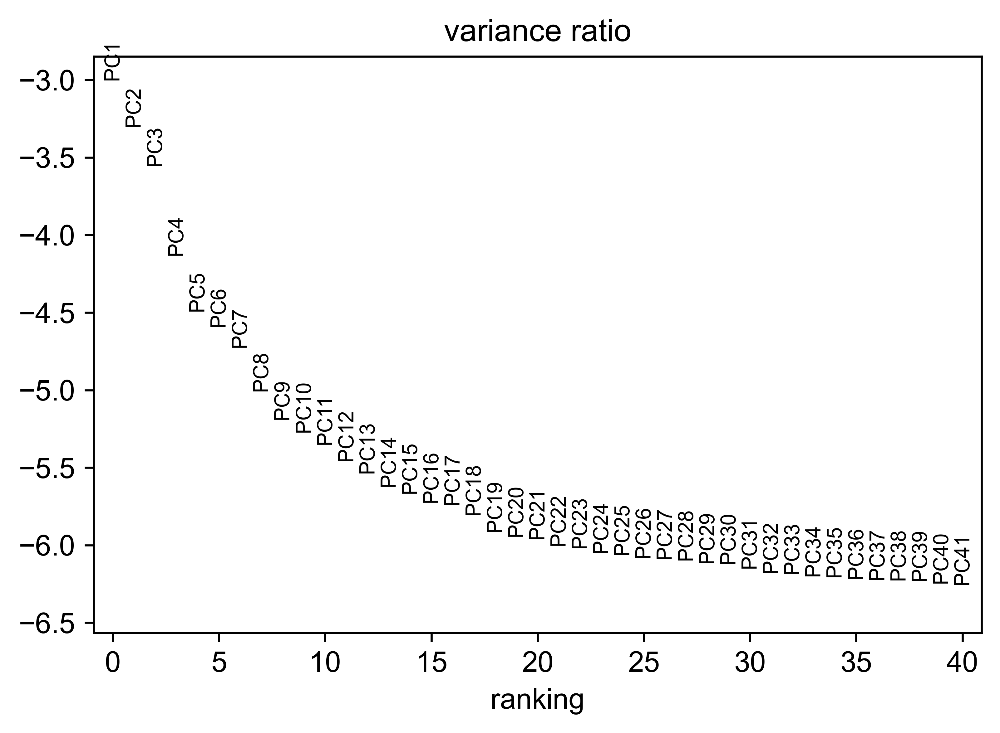

In [35]:
sc.pl.pca_variance_ratio(adata_fib, log=True, n_pcs=40)

In [36]:
sc.pp.neighbors(adata_fib, n_neighbors=10, n_pcs=30)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [37]:
sc.tl.umap(adata_fib)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [38]:
sc.tl.leiden(adata_fib,resolution=1)

running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


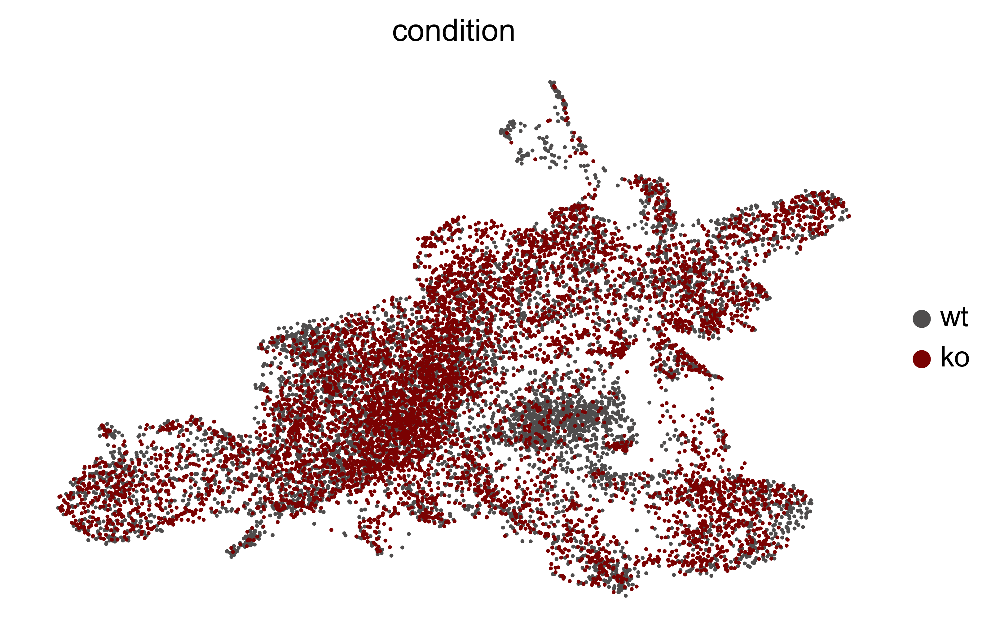

In [12]:
sc.pl.umap(adata_fib,color=['condition'],frameon=False)

In [41]:
clusterid ={
    '0' : 'Papillary',
    '1' : 'Pre-adipo',
    '2' : 'Replicating',
    '3' : 'Intermediate',
    '4' : 'Papillary',
    '5' : 'Replicating',
    '6' : 'Papillary',
    '7' : 'Papillary',
    '8' : 'Reticular',
    '9' : 'Dermal Papillae',
    '10' : 'Reticular',
    '11' : 'Dermal Sheath',
    '12' : 'Fascia',
    '13' : 'Dermal Papillae',
    '14' : 'Reticular',
    '15' : 'Replicating',
    '16' : 'Reticular',
    '17' : 'Replicating',
    '18' : 'Reticular',
    '19' : 'Pre-adipo',
    '20' : 'Papillary',
    '21' : 'Replicating',
    '22' : 'Pre-adipo',
    '23' : 'Intermediate'
}
adata_fib.obs['Cell Type'] = adata_fib.obs['leiden'].map(clusterid).astype('category')

In [7]:
fib = sc.read_h5ad('kdm6bko_fib_final.h5')

In [45]:
sc.tl.dendrogram(adata_fib, groupby='Cell Type',n_pcs=30)

    using 'X_pca' with n_pcs = 30
Storing dendrogram info using `.uns['dendrogram_Cell Type']`


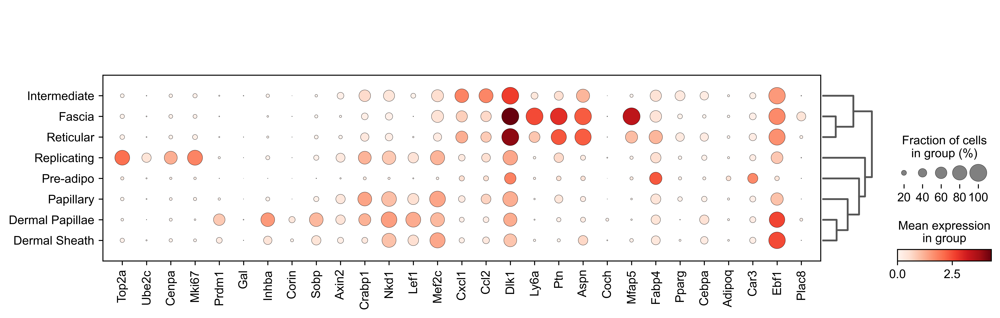

In [53]:
sc.pl.dotplot(adata_fib, ['Top2a','Ube2c','Cenpa','Mki67','Prdm1','Gal','Inhba','Corin','Sobp','Axin2','Crabp1','Nkd1','Lef1','Mef2c','Cxcl1','Ccl2','Dlk1',
            'Ly6a','Ptn','Aspn','Coch','Mfap5','Fabp4','Pparg','Cebpa','Adipoq','Car3','Ebf1','Plac8'],'Cell Type', dendrogram=True)

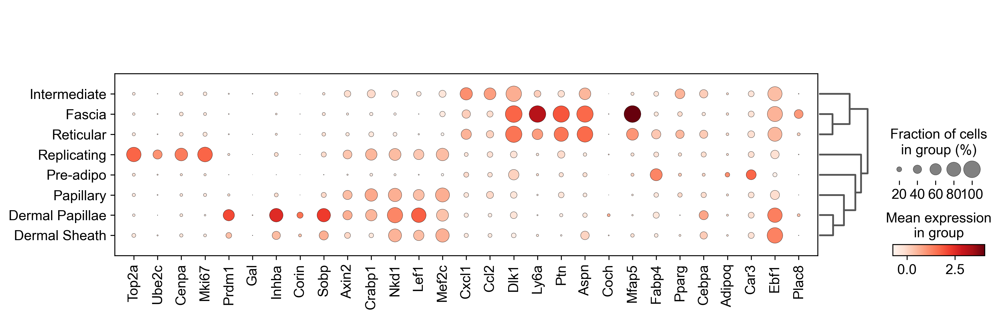

In [153]:
sc.pl.dotplot(adata_fib, ['Top2a','Ube2c','Cenpa','Mki67','Prdm1','Gal','Inhba','Corin','Sobp','Axin2','Crabp1','Nkd1','Lef1','Mef2c','Cxcl1','Ccl2','Dlk1',
            'Ly6a','Ptn','Aspn','Coch','Mfap5','Fabp4','Pparg','Cebpa','Adipoq','Car3','Ebf1','Plac8'],'Cell Type', dendrogram=True)

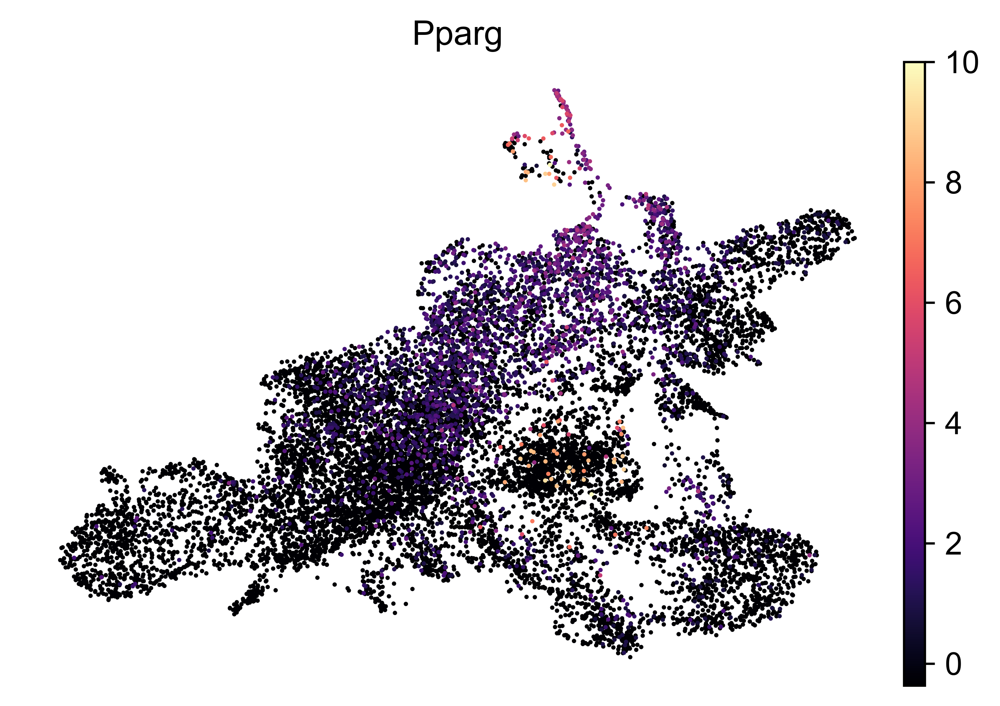

In [43]:
sc.pl.umap(adata_fib,color=['Pparg'],frameon=False,cmap='magma')

In [43]:
godsnot102 = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_fib.uns['Cell Type_colors'])

In [44]:
new_colors[[0]] = godsnot102[[20]] #DP
new_colors[[1]] = godsnot102[[9]] #DS
new_colors[[2]] = godsnot102[[48]] #Fascia
new_colors[[3]] = godsnot102[[21]] #intermediate
new_colors[[4]] = godsnot102[[19]] #Pap
new_colors[[5]] = godsnot102[[42]] #Pre-adipo
new_colors[[6]] = godsnot102[[18]] #Rep Pap
new_colors[[7]] = godsnot102[[24]] #Retic

adata_fib.uns['Cell Type_colors']  = new_colors

In [47]:
sc.tl.paga(adata_fib, groups='Cell Type')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


In [8]:
sc.pl.paga(adata_fib, color=['Cell Type'])

NameError: name 'adata_fib' is not defined

In [49]:
sc.tl.draw_graph(adata_fib, init_pos='paga')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:02:51)


In [8]:
adata_fib.var

,Accession,Chromosome,End,Start,Strand,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
Gene,,,,,,,,,,,,,,,,,
Xkr4,ENSMUSG00000051951,1,3671498,3205901,-,175,False,175,0.009268,99.184947,199.0,False,5.749973e-03,0.136533,-0.491146,0.004027,0.050824
Rp1,ENSMUSG00000025900,1,4409241,3999557,-,29,False,29,0.001397,99.864934,30.0,False,1.117436e-03,1.602393,1.145680,0.000580,0.023077
Sox17,ENSMUSG00000025902,1,4497354,4490931,-,625,False,625,0.151833,97.089097,3260.0,True,9.418654e-02,2.414264,2.052241,0.029278,0.230639
Gm38076,ENSMUSG00000103003,1,4535286,4534837,-,1,False,1,0.000047,99.995343,1.0,False,1.000000e-12,NaN,NaN,0.000000,1.000000
Gm37323,ENSMUSG00000104328,1,4586252,4583129,-,2,False,2,0.000093,99.990685,2.0,False,2.784729e-05,-0.675034,-1.397368,0.000023,0.003044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gm20931,ENSMUSG00000094570,Y,55239871,55213720,+,2,False,2,0.000093,99.990685,2.0,False,5.935322e-05,0.081753,-0.552316,0.000040,0.005435
Sly,ENSMUSG00000101155,Y,57213362,57187188,+,1,False,1,0.000047,99.995343,1.0,False,1.000000e-12,NaN,NaN,0.000000,1.000000
Gm21758,ENSMUSG00000096347,Y,59427276,59395263,+,18,False,18,0.000838,99.916166,18.0,False,1.306689e-03,1.783686,1.348117,0.000618,0.025683


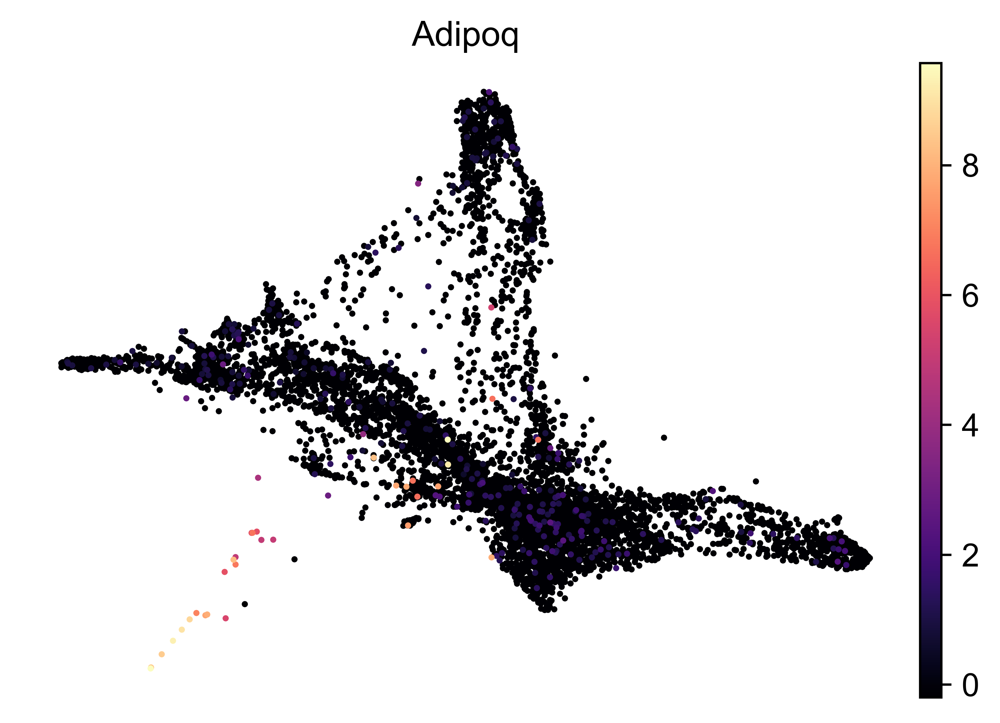

In [13]:
sc.pl.draw_graph(adata_fib[adata_fib.obs['condition'].isin(['ko'])], color=['Adipoq'],frameon=False,cmap='magma')

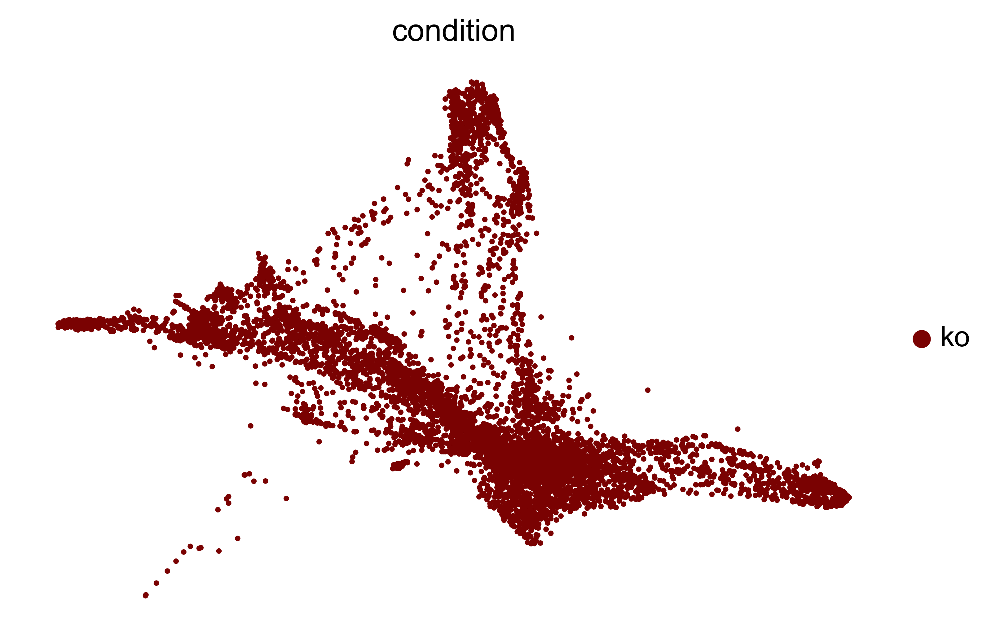

In [15]:
sc.pl.draw_graph(adata_fib[adata_fib.obs['condition'].isin(['ko'])], color='condition',frameon=False)

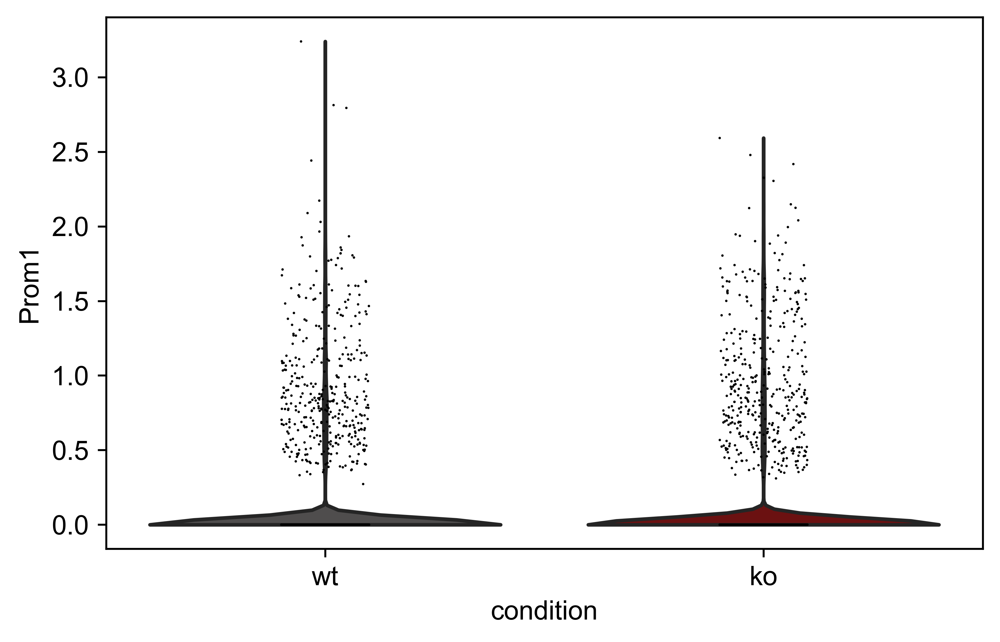

In [55]:
sc.pl.violin(adata_fib,keys=['Prom1'],groupby='condition')

In [8]:
adata_fib.raw

In [60]:
fib = adata_fib.raw.to_adata()

In [15]:
test_rank = de.test.rank_test(
    data=adata_fib,
    is_logged=True,
    grouping="condition"
)
deg=test_rank.summary().sort_values(by=["log2fc"],ascending=True)

In [16]:
deg.to_csv("deg_kdm6b.csv")

In [79]:
adata_fib

AnnData object with n_obs × n_vars = 12947 × 32626
    obs: 'Clusters', '_X', '_Y', 'condition', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Cell Type'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cell Type_colors', 'Cell Type_sizes', 'condition_colors', 'dendrogram_Cell Type', 'draw_graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [83]:
degko=deg[(deg['log2fc']>0)&(deg['qval']<0.05)]
degwt=deg[(deg['log2fc']<0)&(deg['qval']<0.05)]

In [74]:
dp_ko = dpdeg[(dpdeg['log2fc']>0)&(dpdeg['qval']<0.05)]
dp_wt = dpdeg[(dpdeg['log2fc']<0)&(dpdeg['qval']<0.05)]

In [71]:
deg_ko.to_csv("deg_kdm6bko.csv")
deg_wt.to_csv("deg_kdm6bwt.csv")

In [158]:
dftime = adata_fib.obs[['condition','n_genes','total_counts']]

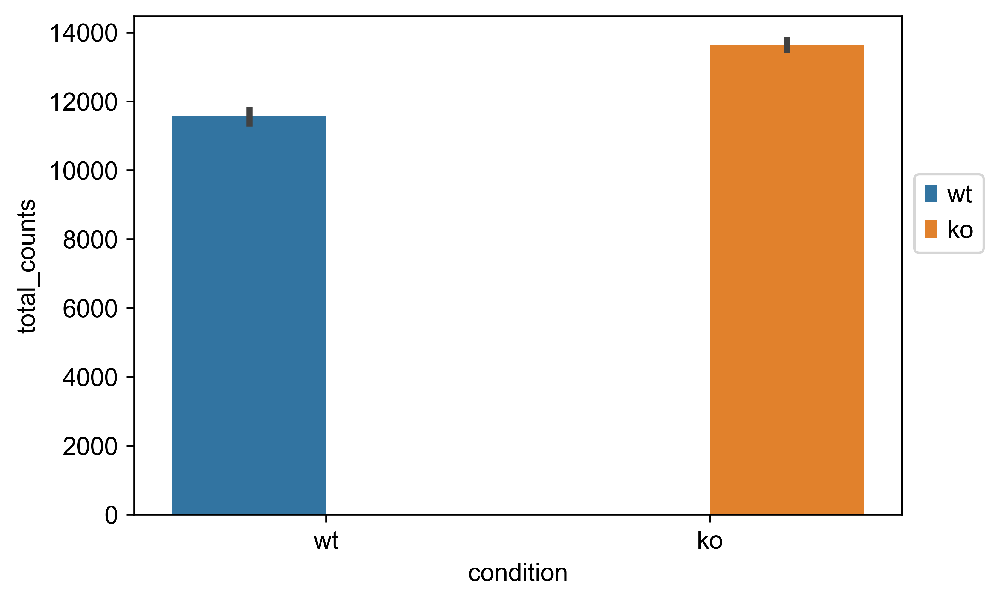

In [163]:
ax=sns.barplot(x="condition", y="total_counts",hue="condition",
            data=dftime)
plt.legend(bbox_to_anchor=(1,0.5),loc='lower left')

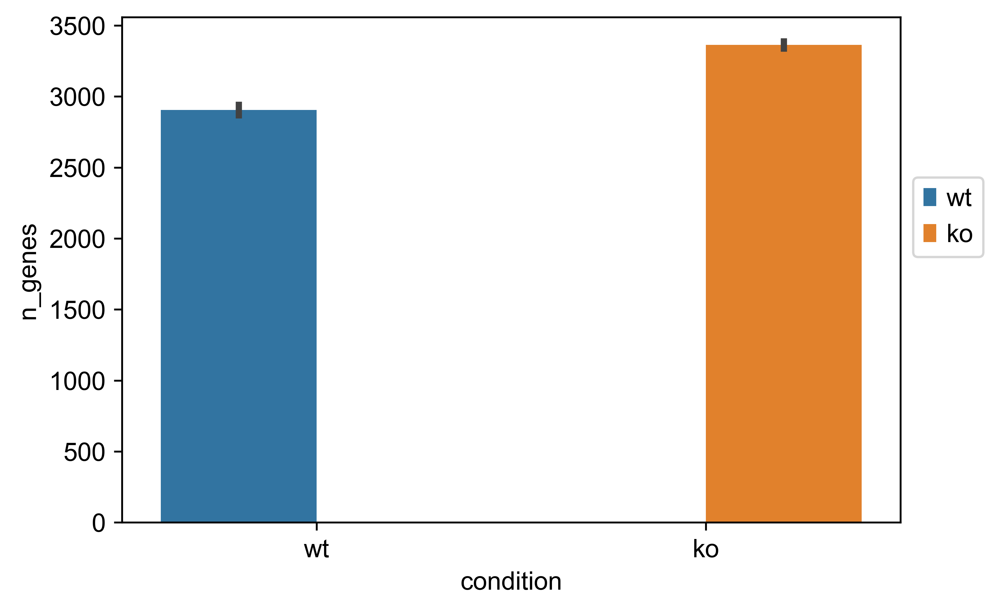

In [164]:
ax=sns.barplot(x="condition", y="n_genes",hue="condition",
            data=dftime)
plt.legend(bbox_to_anchor=(1,0.5),loc='lower left')

In [175]:
df=pd.crosstab(adata_fib.obs['Cell Type'],adata_fib.obs['condition'],normalize='index')

In [253]:
df1=pd.crosstab(adata_fib.obs['Cell Type'],adata_fib.obs['condition'])

In [337]:
df1.to_csv('cellcount.csv')

In [176]:
df = df.reindex(index = ['Dermal Papillae','Dermal Sheath','Papillary','Replicating','Reticular','Intermediate','Fascia','Pre-adipo'])

In [177]:
df

condition,wt,ko
Cell Type,,
Dermal Papillae,0.534786,0.465214
Dermal Sheath,0.475874,0.524126
Papillary,0.457997,0.542003
Replicating,0.460444,0.539556
Reticular,0.437439,0.562561
Intermediate,0.306082,0.693918
Fascia,0.471239,0.528761
Pre-adipo,0.819560,0.180440


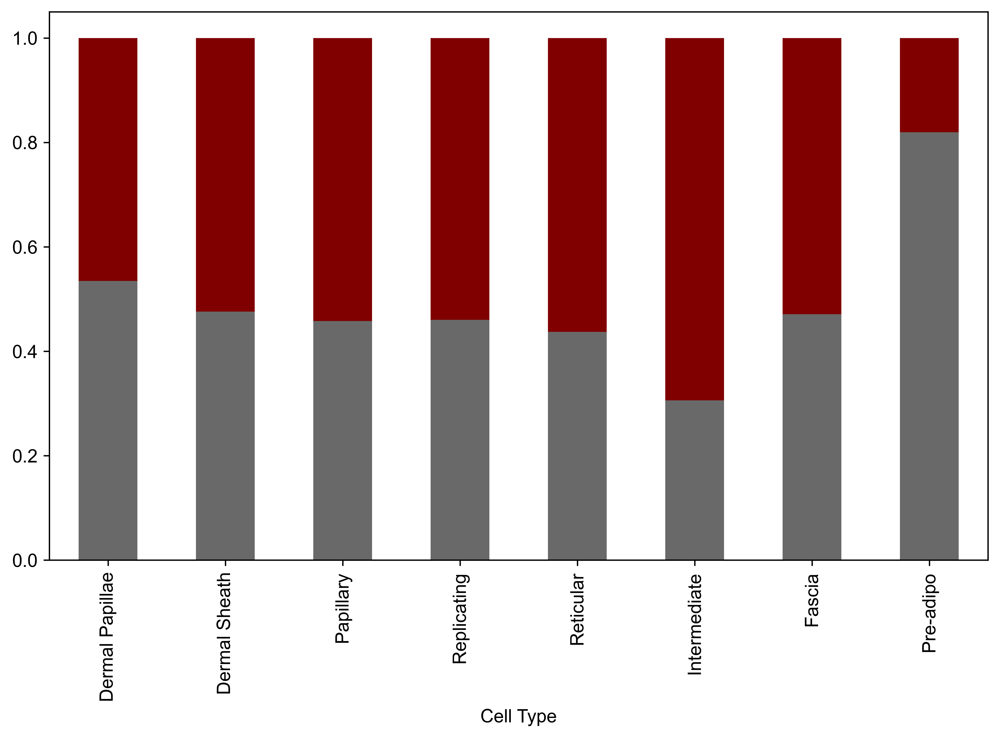

In [178]:
df.plot(kind='bar',stacked=True, figsize=(10,6),legend= None,color=['dimgrey','maroon'])
plt.grid(visible=False)
plt.show()

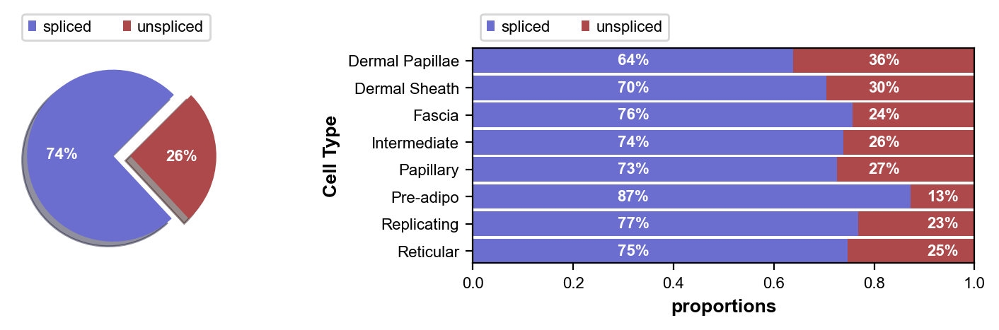

In [79]:
scv.pl.proportions(adata_fib,groupby='Cell Type',use_raw=True)

In [182]:
scv.pp.moments(adata_fib, n_pcs=30, n_neighbors=10)

Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:06) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [183]:
scv.tl.recover_dynamics(adata_fib,n_jobs=20)

recovering dynamics (using 20/24 cores)



    finished (0:01:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [184]:
scv.tl.velocity(adata_fib,mode='dynamical')

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [185]:
scv.tl.velocity_graph(adata_fib)

computing velocity graph (using 1/24 cores)



    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [11]:
adata_fib.uns['condition_colors']=['#4F4D4D','#7A0202']

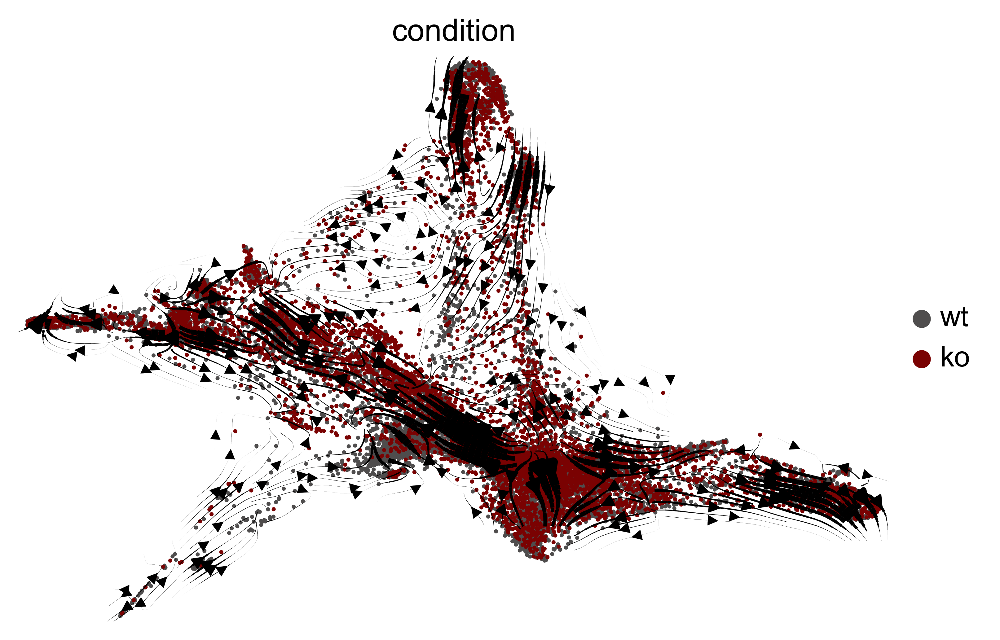

In [293]:
scv.pl.velocity_embedding_stream(adata_fib, basis='draw_graph_fa',color=['condition'],density=4,size=10,arrow_size=1,linewidth=2.5,max_length=15,alpha=1,legend_loc='right')

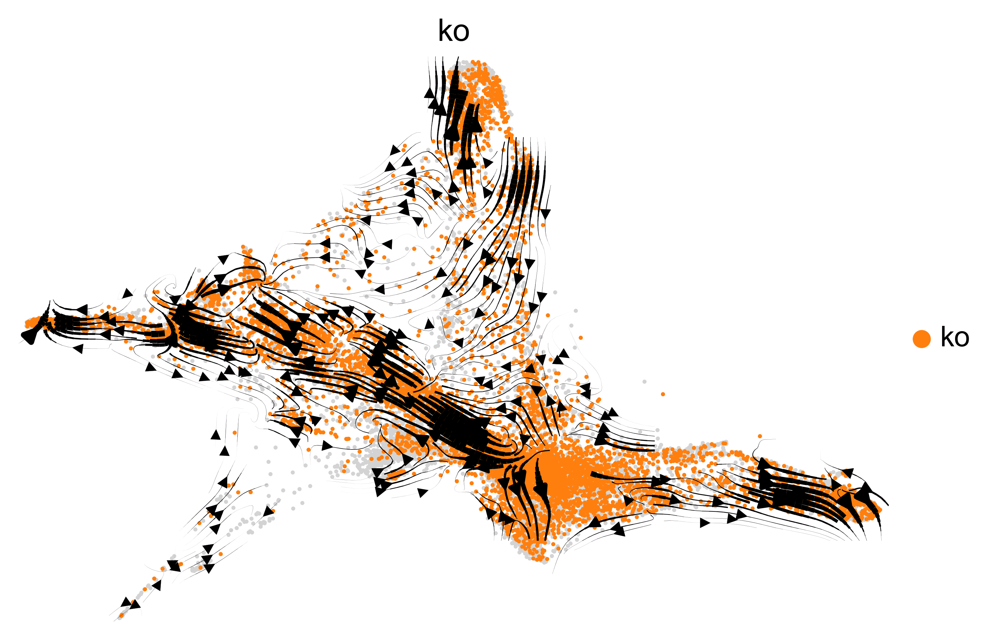

In [190]:
scv.pl.velocity_embedding_stream(adata_fib, basis='draw_graph_fa',color=['condition'],groups='ko',density=4,size=10,arrow_size=1,linewidth=2.5,max_length=15,alpha=1,legend_loc='right')

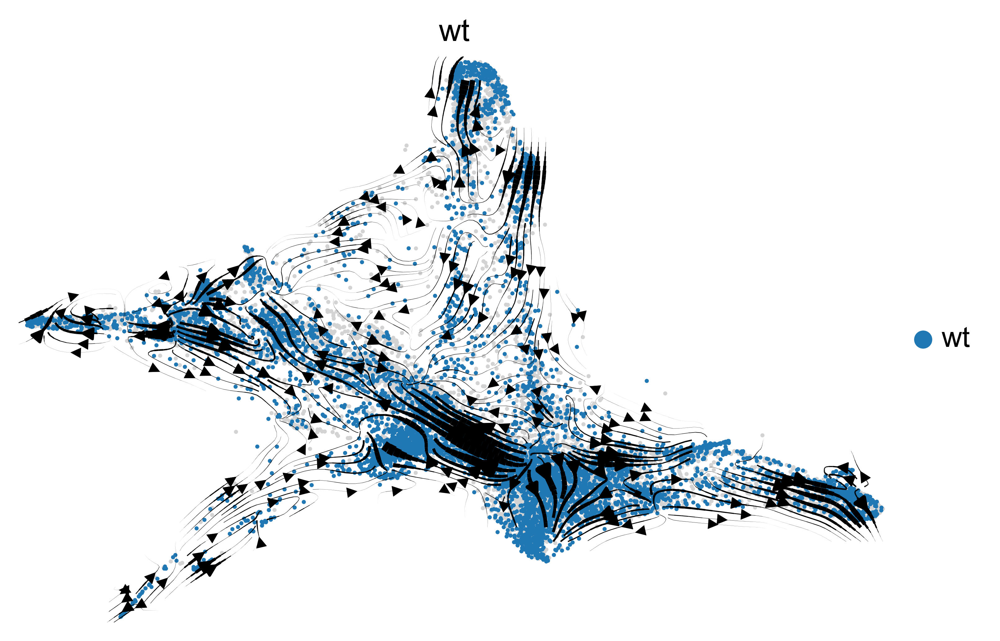

In [191]:
scv.pl.velocity_embedding_stream(adata_fib, basis='draw_graph_fa',color=['condition'],groups='wt',density=4,size=10,arrow_size=1,linewidth=2.5,max_length=15,alpha=1,legend_loc='right')

In [218]:
scv.tl.rank_dynamical_genes(adata_fib, groupby='Cell Type')
dfboth = scv.get_df(adata_fib, 'rank_dynamical_genes/names')
dfboth.head(20)

ranking genes by cluster-specific likelihoods
    finished (0:00:02) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Dermal Papillae,Dermal Sheath,Fascia,Intermediate,Papillary,Pre-adipo,Replicating,Reticular
0,Stmn2,Igfbp3,Akr1c18,Dab2,Dab2,Mrap,Top2a,Fndc1
1,Inhba,Stmn2,Sema3c,Rgs16,Rgs16,Plin1,Tk1,Igfbp7
2,Igfbp3,Col11a1,Fndc1,Gng11,Gng11,Car3,Nusap1,Thbs1
3,Flt1,Ifitm1,Tnxb,Ifitm1,Ifitm1,Lipe,Pbk,Dlk1
4,Ndnf,Rgs16,Nrk,S1pr1,S1pr1,Actb,Cdk1,Tnxb
5,Rspo3,Gng11,Akap12,Rasgrp2,Rasgrp2,Cd36,Actb,Aspn
6,Rgs16,S1pr1,Ccn3,Bpgm,Bpgm,Apoe,Pclaf,Has1
7,Serpine2,Ednrb,Timp3,Gpd1,Gpd1,H19,Rgs16,Rbp1
8,Gng11,Rasgrp2,H19,Snhg9,Snhg9,Trf,Gng11,Akap12
9,Ifitm1,Bpgm,Rgs16,F11r,F11r,Pcx,Ifitm1,Eln


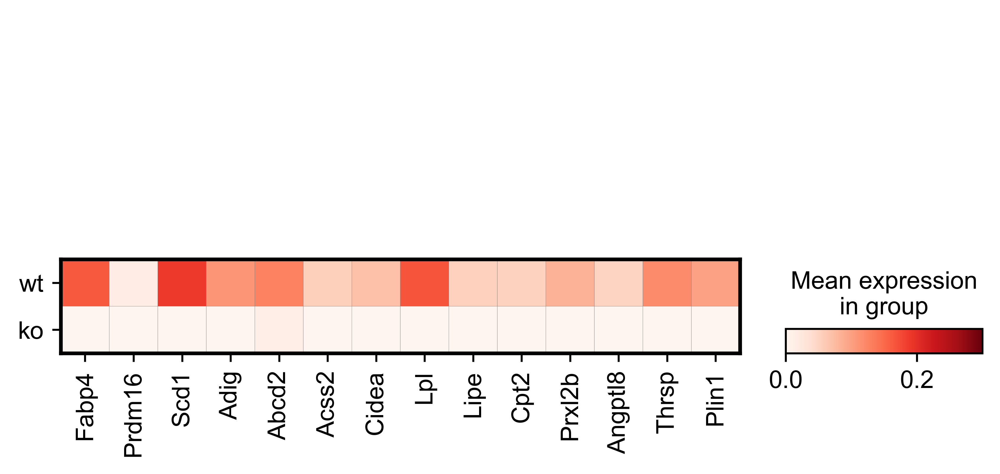

In [267]:
sc.pl.matrixplot(adata_fib,var_names=['Fabp4','Prdm16','Scd1','Adig','Abcd2','Acss2','Cidea','Lpl','Lipe','Cpt2','Prxl2b','Angptl8','Thrsp','Plin1'],groupby='condition',cmap='Reds',vmin=0,vmax=0.3)

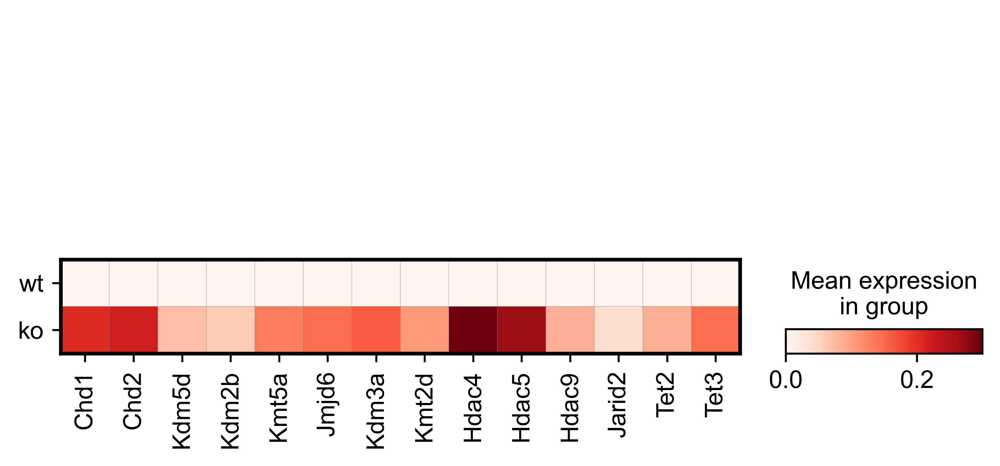

In [272]:
sc.pl.matrixplot(adata_fib,var_names=['Chd1','Chd2','Kdm5d','Kdm2b','Kmt5a','Jmjd6','Kdm3a','Kmt2d','Hdac4','Hdac5','Hdac9','Jarid2','Tet2','Tet3'],groupby='condition',cmap='Reds',vmin=0,vmax=0.3)

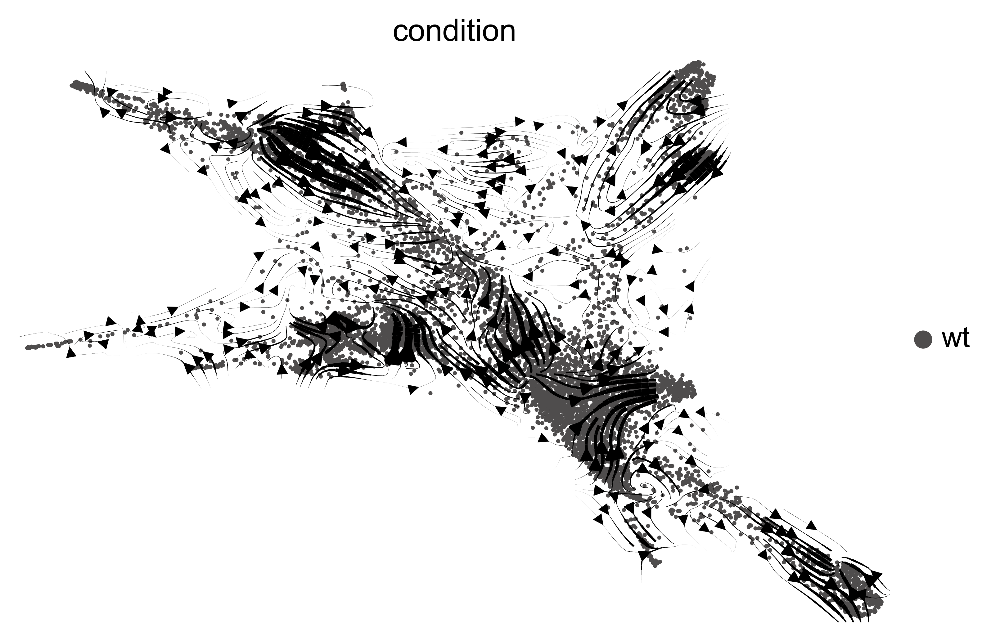

In [285]:
scv.pl.velocity_embedding_stream(fibwt, basis='draw_graph_fa',color=['condition'],density=4,size=10,arrow_size=1,linewidth=2.5,max_length=15,alpha=1,legend_loc='right')

In [274]:
fib

AnnData object with n_obs × n_vars = 12947 × 32626
    obs: 'Clusters', '_X', '_Y', 'condition', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Cell Type', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'Cell Type_colors', 'Cell Type_sizes', 'condition_colors', 'dendrogram_Cell Type', 'dendrogram_leiden', 'draw_graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'paga', 'pca', 'rank_dynamical_genes', 'rank_genes_groups', 'recover_dynamics', 'umap', 'veloc

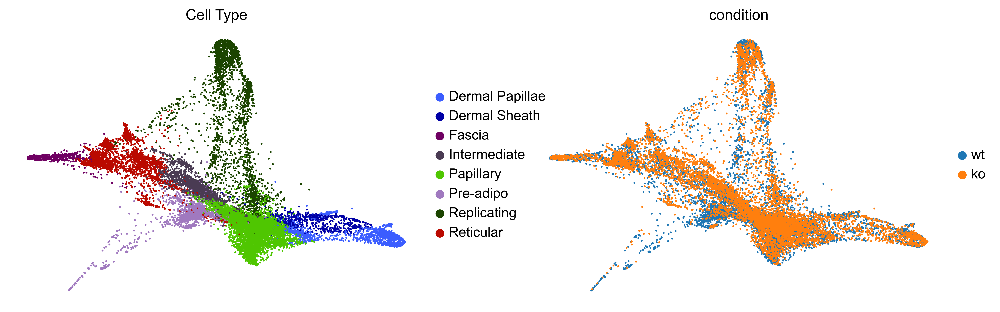

In [204]:
sc.pl.draw_graph(fib, color=['Cell Type','condition'],frameon=False,cmap='magma')

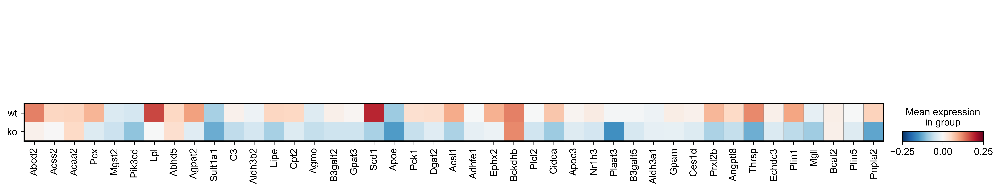

In [18]:
sc.pl.matrixplot(adata_fib,var_names=lipid1,groupby='condition',vmin=-0.25,vmax=0.25,cmap='RdBu_r')

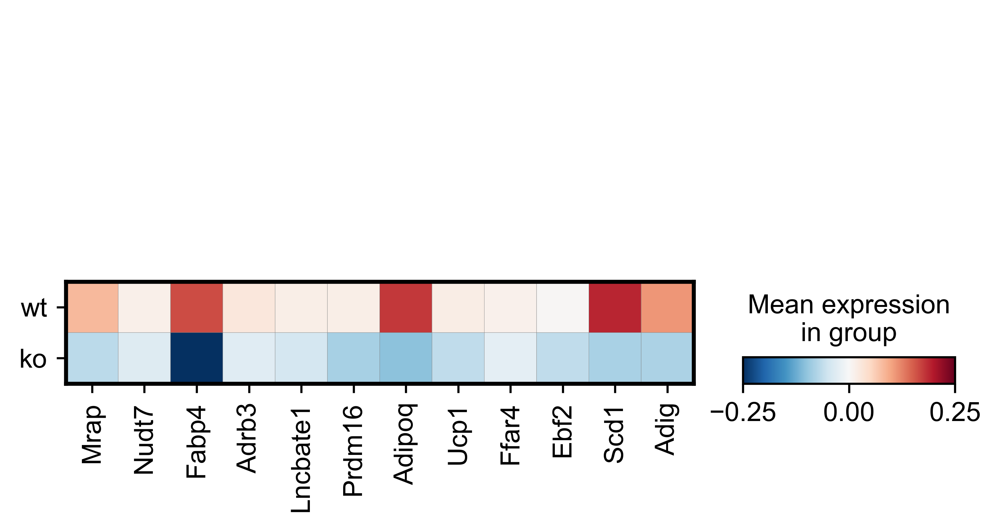

In [43]:
bfd=split_list(brownfd)
sc.pl.matrixplot(adata_fib,var_names=bfd,groupby='condition',vmin=-0.25,vmax=0.25,cmap='RdBu_r')

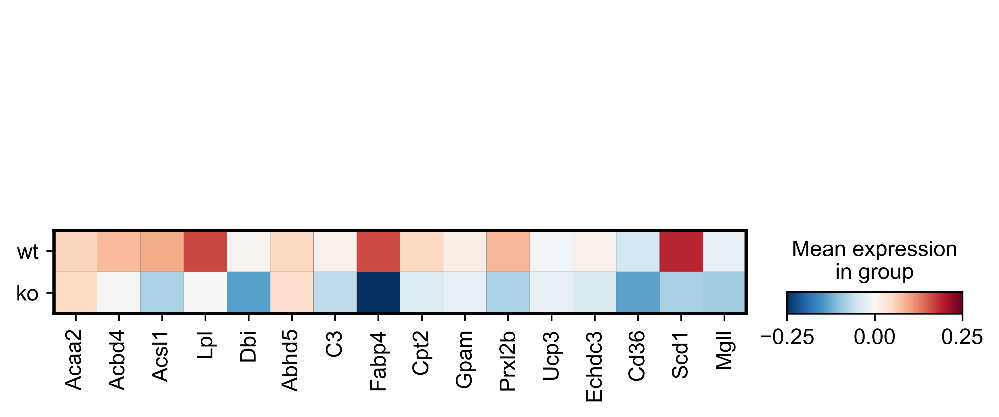

In [44]:
famp="ACAA2, ACBD4, ACSL1, LPL, DBI, ABHD5, C3, FABP4, CPT2, GPAM, PRXL2B, UCP3, ECHDC3, CD36, SCD1, MGLL"
famp1=split_list(famp)
sc.pl.matrixplot(adata_fib,var_names=famp1,groupby='condition',vmin=-0.25,vmax=0.25,cmap='RdBu_r')

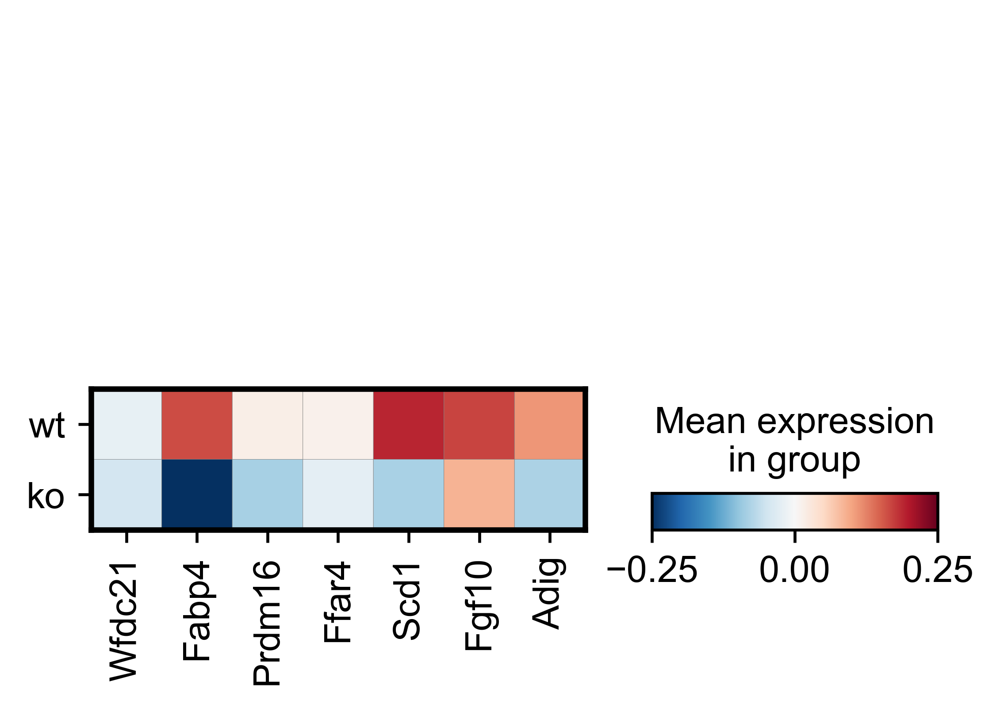

In [45]:
wfcd="WFDC21, FABP4, PRDM16, FFAR4, SCD1, FGF10, ADIG"
wfcd1=split_list(wfcd)
sc.pl.matrixplot(adata_fib,var_names=wfcd1,groupby='condition',vmin=-0.25,vmax=0.25,cmap='RdBu_r')

In [46]:
wf2=df[df['gene'].isin(wfcd1)]

In [37]:
from adjustText import adjust_text

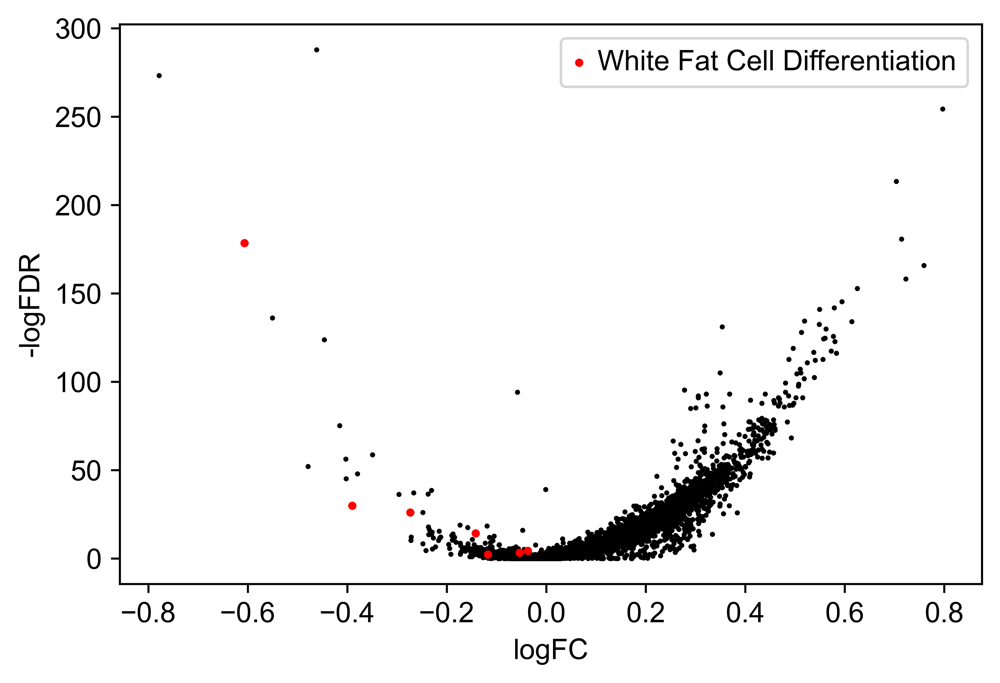

In [51]:
plt.scatter(x=df['log2fc'],y=df['qval'].apply(lambda x:-np.log10(x)),s=1,color= "black")

plt.scatter(x=wf2['log2fc'],y=wf2['qval'].apply(lambda x:-np.log10(x)),s=5,label="White Fat Cell Differentiation",color="red")
texts=[]

plt.xlabel("logFC")
plt.ylabel("-logFDR")
plt.legend()